In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science', 'ieee','no-latex', 'bright'])

In [2]:
#helper functions
def get_error(pred, target):
    # differences = np.abs(target-pred)
    differences = target-pred
    return 100*(differences/target)

def preprocess_norm(data):
    # done after applying hilbert transform
    shifted_ut = np.zeros(data.shape)
    for i in range(data.shape[0]):
        for j in range(data.shape[2]):
            shifted_ut[i,:,j] = data[i,:,j]/np.nanmax(data[i,:,j])
    return shifted_ut

def preprocess_align(data):
    # done after applying hilbert transform
    shifted_ut = np.zeros(data.shape)
    for i in range(data.shape[0]):
        for j in range(data.shape[2]):
            a_scan = data[i,:,j]
            peak = np.argmax(a_scan[:])
            shifted_a_scan = a_scan[peak::]
            shifted_ut[i,0:(data.shape[1]-peak),j] = shifted_a_scan
    return shifted_ut

In [6]:
root='C:/Users/Shaun McKnight/OneDrive - University of Strathclyde/SEARCH NDE/Composites/Exp Data/Spirit Cell/LearJet/lear3/lear3_hilbert_raster.npy'
data=np.load(root)
print(data.shape)

data=preprocess_align(data)
data=preprocess_align(data)

np.save('C:/Users/Shaun McKnight/OneDrive - University of Strathclyde/SEARCH NDE/Composites/Exp Data/Spirit Cell/LearJet/lear3/lear3_hilbert_raster_aligned.npy', data)

(536, 2000, 366)


findfont: Font family ['serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'serif' not found because none of the following families were found: Times


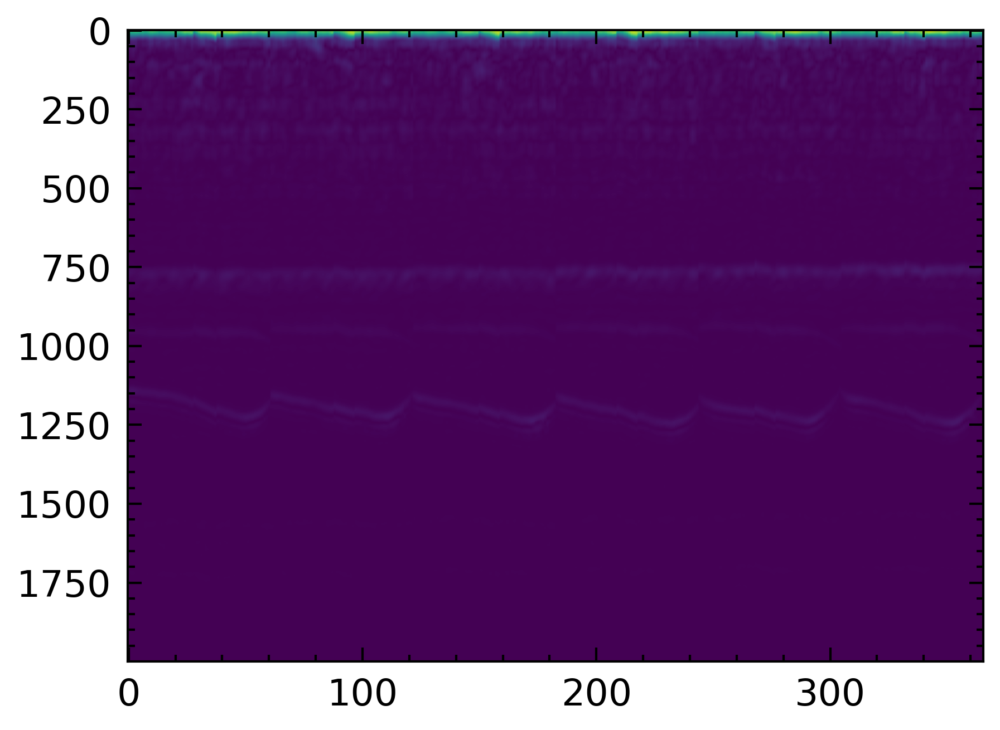

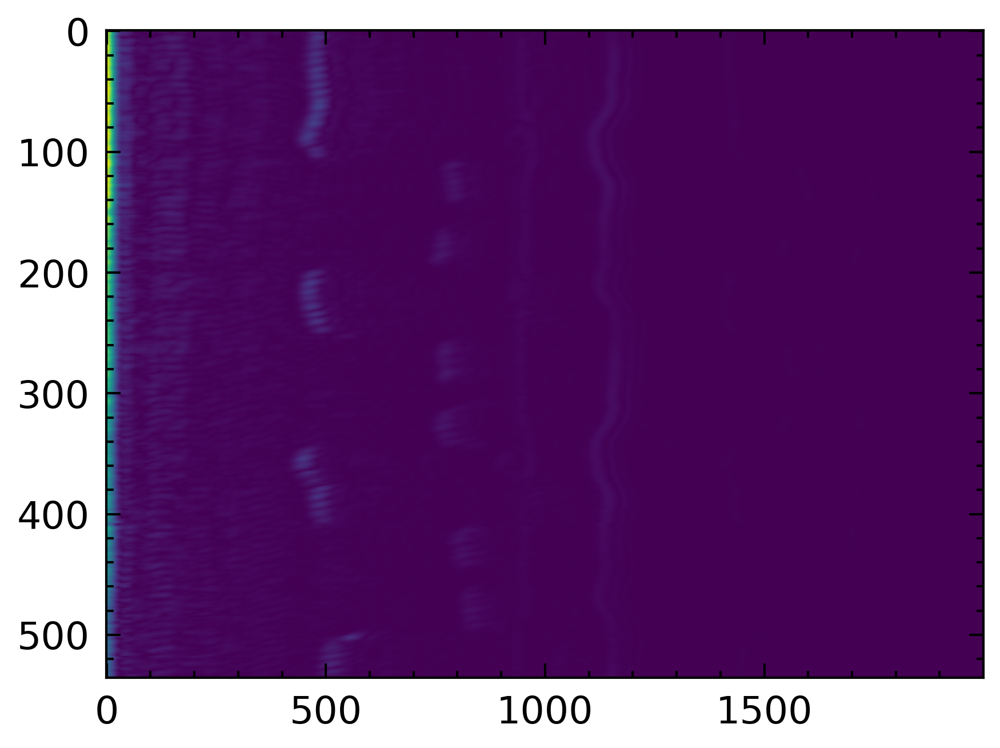

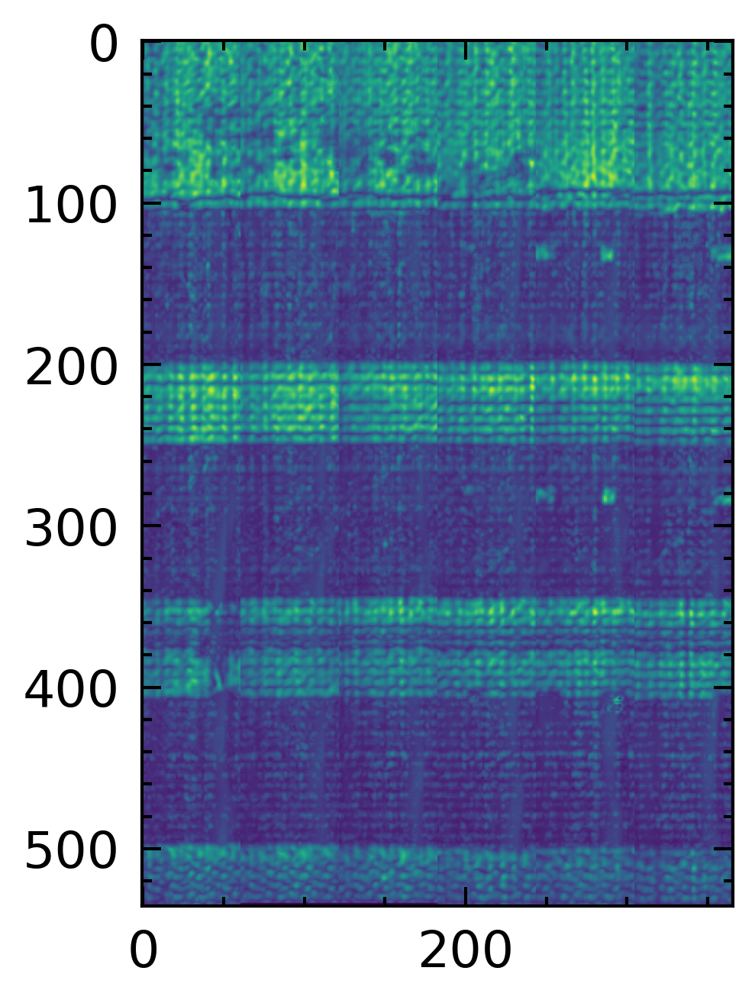

In [4]:
plt.figure()
plt.imshow(data[round(data.shape[0]/2),:,:], aspect='auto')
plt.show()

plt.figure()
plt.imshow(data[:,:,round(data.shape[2]/2)], aspect='auto')
plt.show()

plt.figure()
plt.imshow(np.amax(data[:,100:,:], axis=1))
plt.show()

# plt.figure()
# plt.plot(data[100,:,100])

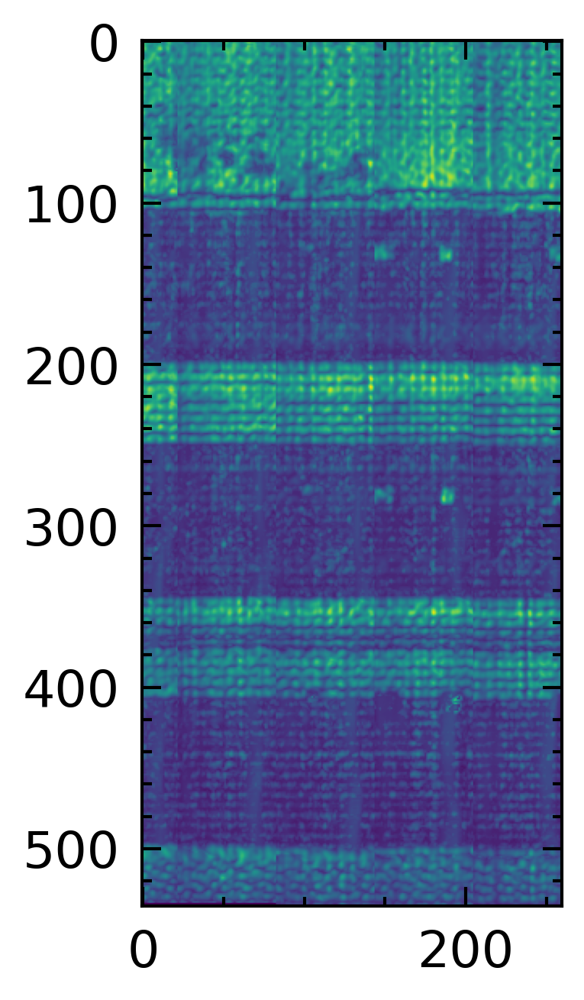

In [5]:
test=np.copy(data[:,:,100:360])

plt.figure()
plt.imshow(np.amax(test[:,100:,:], axis=1))
plt.show()

# test model

In [6]:
import numpy as np
import itertools
import time
import datetime
import math
from pathlib import Path
import os

import torchvision.transforms as transforms
from torchvision.utils import save_image
from torch.utils.data import DataLoader
from torch.autograd import Variable
from torchvision.utils import make_grid
import torch.nn.functional as F
import torch
from torchinfo import summary
from torch.utils.data import Dataset
import torch.distributions as dist

import classifier

C:\Users\Shaun McKnight\anaconda3\envs\torch_phd\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
class CleanDataset(Dataset):
    def __init__(self, data, transforms_=None):
        self.transform = transforms.Compose(transforms_)
        
        self.id007=data
            
        print('~~~~ Synthetic dataloader INFO ~~~~~')
        print('Number points train ~ ', 'Max/Min ', np.amax(self.id007), np.amin(self.id007))
        #length 500 time series
              
    def __getitem__(self, index):       
        base_data=self.id007[index:index+65]
        
        data = base_data[:64]
        label = base_data[64]   
        
        return torch.from_numpy(np.copy(data)).unsqueeze(0), torch.from_numpy(np.copy(label)).unsqueeze(0)
        #At least one stride in the given numpy array is negative, and tensors with negative strides are not currently supported. (You can probably work around this by making a copy of your array  with array.copy().) 

    def __len__(self):
        return self.id007.size-65

In [8]:
def validationv2(
    test_data,
    Tensor,
    Net,
    threshold=0.99,
    plot=None
):
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
        
    predictions = np.zeros(test_data.shape)
    segmented = np.zeros(test_data.shape)
    errors = np.zeros(test_data.shape)
    
    test_mapped=np.copy(test_data)
    prediction_mapped=[]
    
    prev_time = time.time()
    Net.eval()
    
    threshold=np.full(test_mapped.shape[0], threshold)
    threshold=torch.Tensor(threshold).to(device).unsqueeze(1)


    nan_indices = np.argwhere(np.isnan(test_mapped))
    if nan_indices.size > 0:
        print("NaN values are located at:")
        for index in nan_indices:
            print(index)
    else:
        print("Test data does not contain NaN values.")
        
    with torch.no_grad():
        for i in range(0,test_mapped.shape[1]-65):
            batch=torch.Tensor(np.expand_dims(test_mapped[:,i:i+64],1))
            targets=np.squeeze(test_mapped[:,i+64])
            targets=torch.Tensor(targets).cpu().numpy()          
            batch=batch.to(device)
            
            out_means, out_std = Net(batch)
            dists=dist.Normal(out_means, out_std)
            out_means=out_means.squeeze().cpu().numpy()

         
            threshold_values=dists.icdf(threshold).squeeze().cpu().numpy()
             
            mask=np.copy(targets)>np.copy(threshold_values)
            

            test_mapped[:,i+64][mask]=out_means[mask] # check these are working, strange broadcasting behavour
            # segmented[:,i+64]=mask
            predictions[:,i+64]=out_means
            errors[:,i+64]=get_error(out_means, targets)
            
            if plot:
                # if i>150:
                idx=0
                
                print(mask[idx])
                print('Target    : ',targets[idx])
                print('Prediction: ',out_means[idx])
                print('Threshold : ',threshold_values[idx])
                if mask[idx]==1:
                    print('Threshold exceeded!!!', mask[idx])
                plt.figure(figsize=(10,5))
                plt.plot(batch[idx,:,:].cpu().numpy().squeeze().squeeze(), label='Signal')
                plt.scatter(64, targets[idx], label='GT', marker='o')
                plt.scatter(64, out_means[idx], label='Mean prediction', marker='x')
                plt.scatter(64, threshold_values[idx], label='Threshold', marker='_')
                plt.legend()
                plt.xlabel('Samples')
                plt.ylabel('Amplitude')
                plt.show()
                
        segmented[test_data!=test_mapped]=1

            # print(targets[idx],prediction[idx],threshold_value)
    
#     plt.figure()
#     plt.imshow(test_data)
#     plt.show()
    
#     plt.figure()
#     plt.imshow(test_mapped)
#     plt.show()
    
#     plt.figure()
#     plt.imshow(errors)
#     plt.show()

#     plt.figure()
#     plt.imshow(segmented)
#     plt.show()


    print('Finished Validation, inference time: ', time.time() - prev_time)
    return errors, segmented, predictions, test_mapped

In [9]:
#data loader
test_dataloader = DataLoader(
        CleanDataset(test, transforms_ = True),
        batch_size=2,
        shuffle=False,
        # num_workers=1,
)

~~~~ Synthetic dataloader INFO ~~~~~
Number points train ~  Max/Min  1.0 0.0


In [10]:
# model_path = 'C:/GIT/Self-supervised-volumetric-detection/saved_models/exp_4/best_model_epoch_702_model.pt' #209 is model w/o adjustment up
model_path = 'C:/GIT/Self-supervised-volumetric-detection/saved_models/dist/epoch_69_model.pth'
top_model = classifier.CNN()
top_model.load_state_dict(torch.load(model_path))

# top_model = torch.load(model_path)
# print(top_model)

cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

if cuda:
    top_model = top_model.to('cuda')
    print('Cuda')

Cuda


(324, 900, 536)


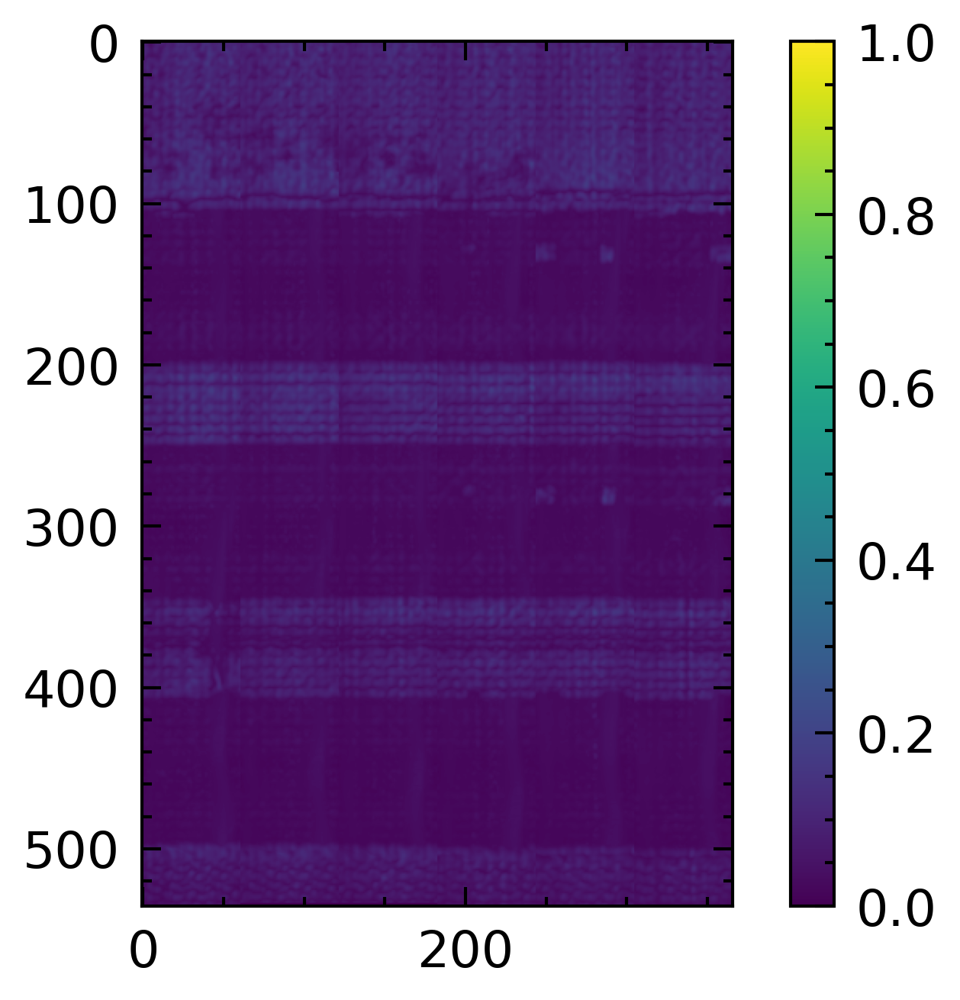

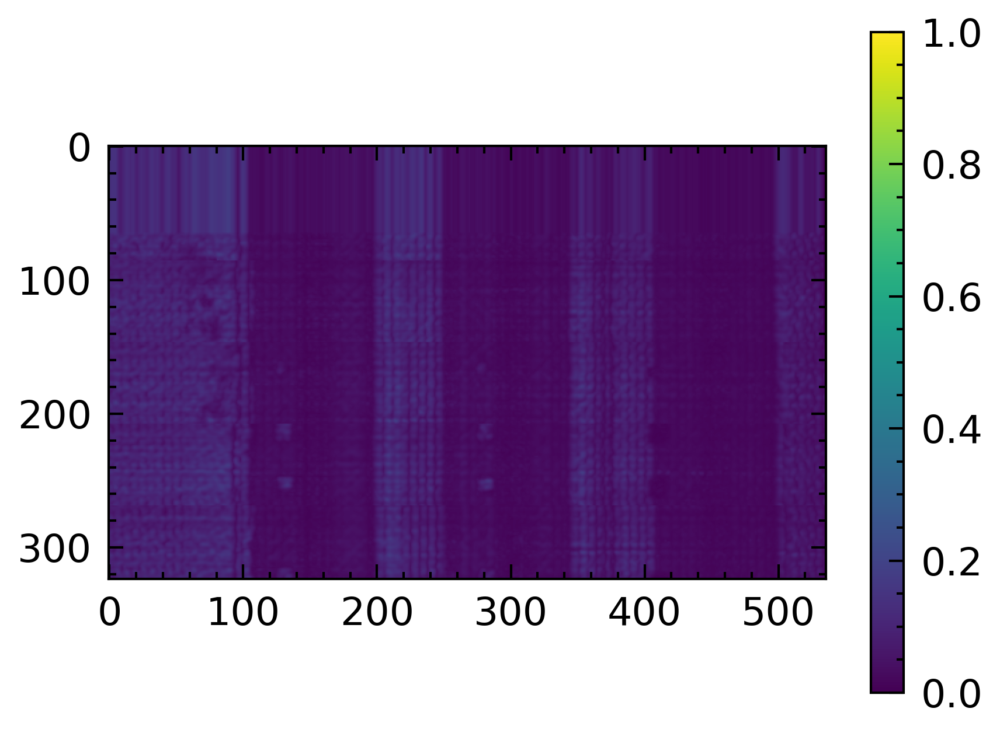

In [17]:
test_main=np.copy(data[:,:900,100:360])
test_main=np.swapaxes(test_main, 0,2)
test=np.pad(test_main,((64,0),(0,0),(0,0)),'edge')

print(test.shape)
plt.figure()
plt.imshow(np.amax(data[:,200:,:],1))
plt.clim(0,1)
plt.colorbar()
plt.show()

plt.figure()
plt.imshow(np.amax(test[:,200:,:],1))
plt.clim(0,1)
plt.colorbar()
plt.show()

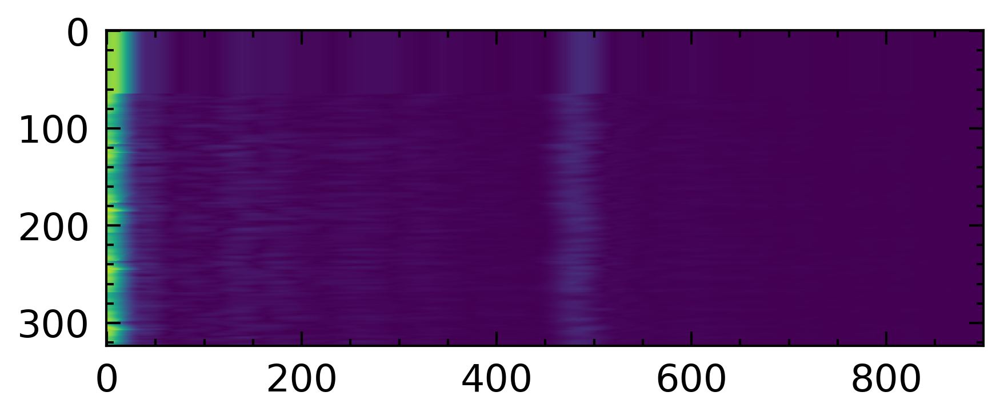

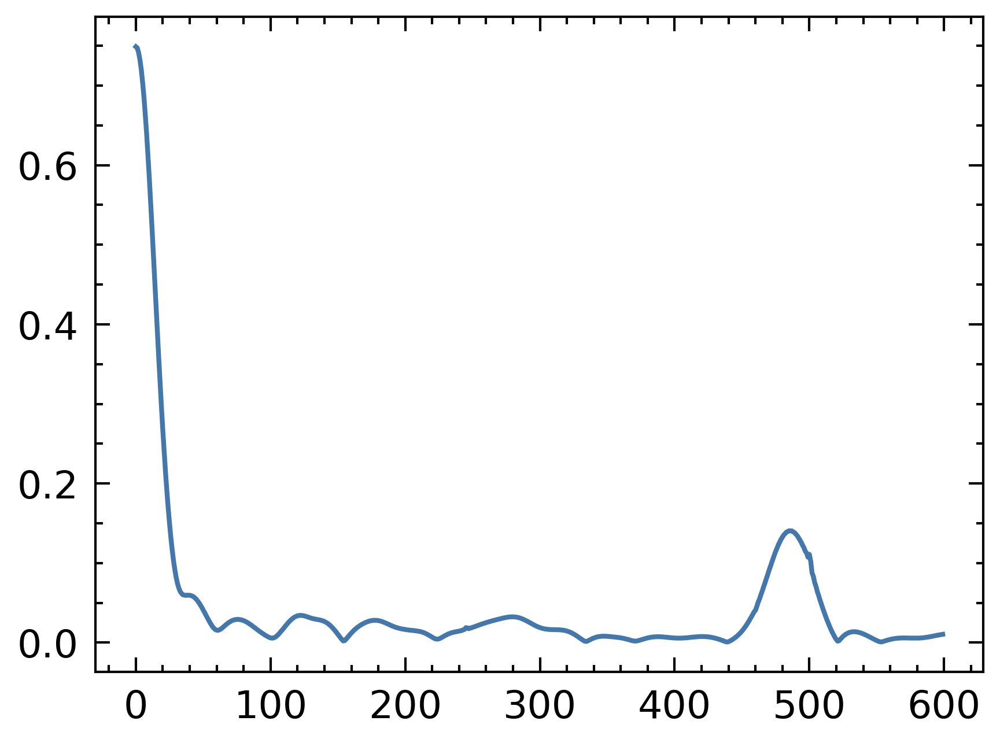

In [12]:
plt.figure()
plt.imshow(test[:,:,23])
plt.show()

plt.figure()
plt.plot(test[0,0:600,5])
plt.show()

# Forward

(324, 900, 536)


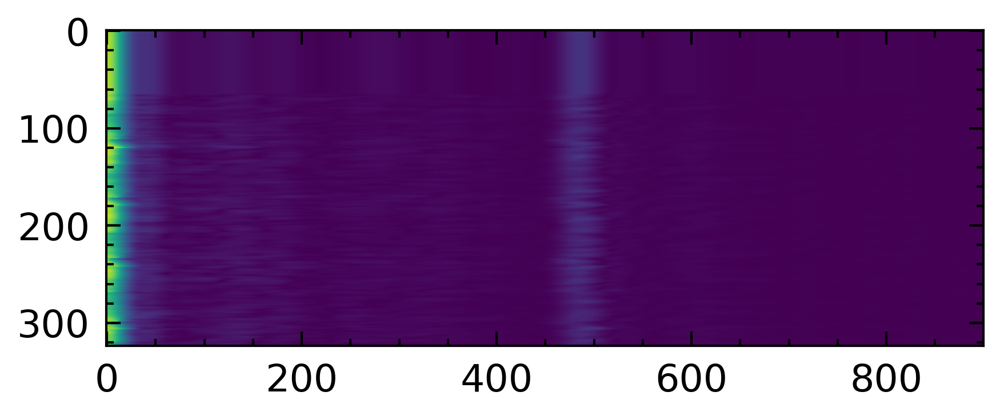

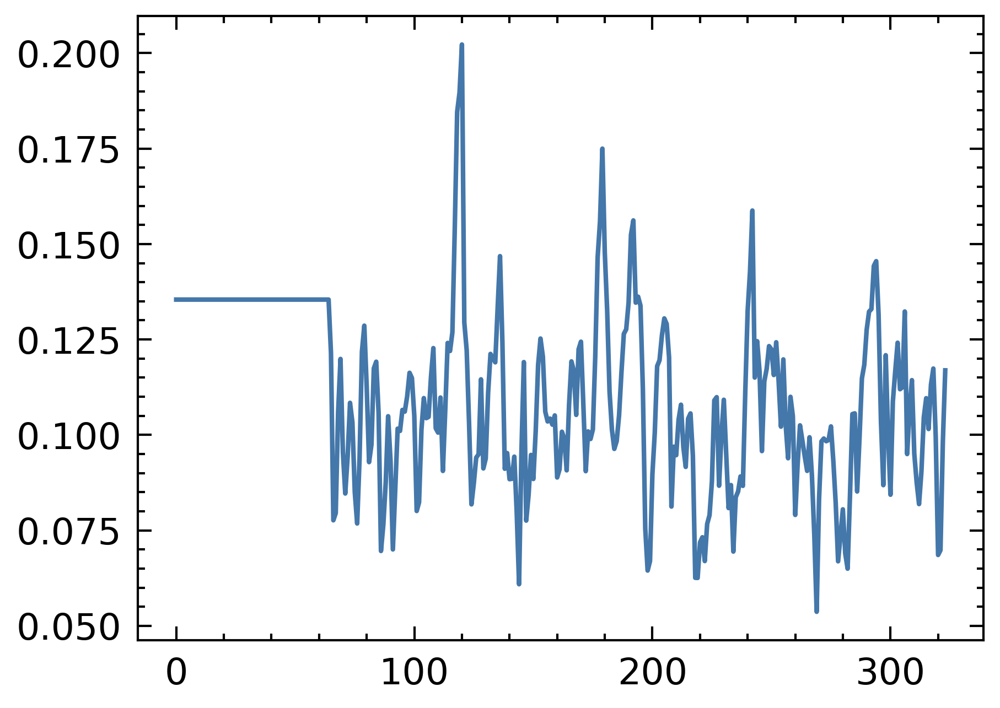

0
Test data does not contain NaN values.
Finished Validation, inference time:  16.573002815246582
0.0% complete
1
Test data does not contain NaN values.
Finished Validation, inference time:  2.558995008468628
0.11% complete
2
Test data does not contain NaN values.
Finished Validation, inference time:  2.5820059776306152
0.22% complete
3
Test data does not contain NaN values.
Finished Validation, inference time:  2.577003240585327
0.33% complete
4
Test data does not contain NaN values.
Finished Validation, inference time:  2.5770058631896973
0.44% complete
5
Test data does not contain NaN values.
Finished Validation, inference time:  2.5700016021728516
0.56% complete
6
Test data does not contain NaN values.
Finished Validation, inference time:  2.5905070304870605
0.67% complete
7
Test data does not contain NaN values.
Finished Validation, inference time:  2.590031147003174
0.78% complete
8
Test data does not contain NaN values.
Finished Validation, inference time:  2.5810070037841797
0.

In [13]:
segmented_volume=np.zeros(test.shape)
errors_total=np.zeros(test.shape)
print(test.shape)

# plt.imshow(np.amax(test[:,:,:], axis=1),aspect='auto')
# plt.show()

plt.imshow(test[:,:,0])

plt.figure()
plt.plot(test[:,32,0])
# plt.plot(test[140:,32,0])
plt.show()

start_time=time.time()

for i in range(0,test.shape[1]): #13-16
    print(i)
    # test_slice=test[:,i,:]
    test_slice=test[:,i,:]
    errors, segmented, predictions, mapped_data = validationv2(
            np.swapaxes(test_slice+1,0,1),#[20:23,:], #need d axes at the end
            Tensor=Tensor,
            Net=top_model,
            threshold=0.99999,
            # threshold=0.9999999,
            # plot=True
    )
    
    # if i==32:
    #         errors, segmented, predictions, mapped_data = validationv2(
    #         np.swapaxes(test_slice+1,0,1),#[20:23,:], #need d axes at the end
    #         Tensor=Tensor,
    #         Net=top_model,
    #         threshold=0.999,
    #         plot=True
    # )
    # else:
    #         errors, segmented, predictions, mapped_data = validationv2(
    #         np.swapaxes(test_slice+1,0,1),#[20:23,:], #need d axes at the end
    #         Tensor=Tensor,
    #         Net=top_model,
    #         threshold=0.999,
    #         # threshold=0.9999999,
    #         # plot=True
    # )
    # print(np.median(errors),'%')
    # print(test_slice.shape)
    # print(segmented_volume[:,i,:].shape, segmented.shape)
    segmented_volume[:,i,:]=np.swapaxes(segmented, 0,1)
    errors_total[:,i,:]=np.swapaxes(errors, 0,1)
    print(f'{round(100*(i/segmented_volume.shape[1]), 2)}% complete')
print('FINISHED')
print('Complete time: ', time.time() - start_time)

# Backwards

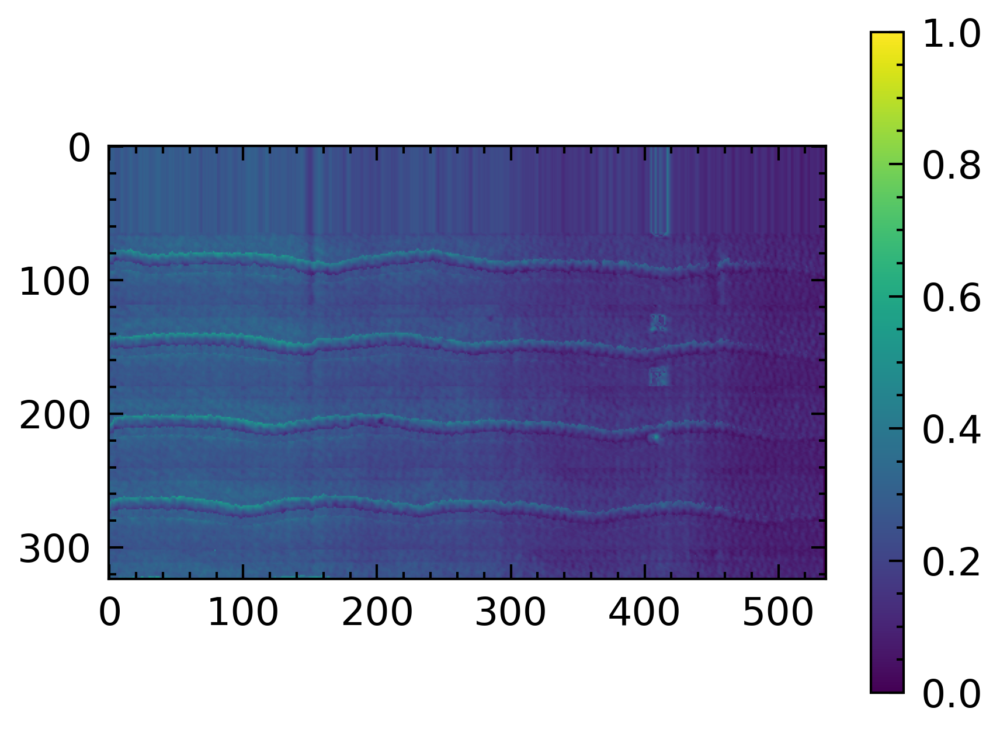

In [18]:
# backward
# test=data[20:250,0:800:10,130:]
test=np.pad(test_main,((0,64),(0,0),(0,0)),'edge')
test=np.flip(test, axis=0)

plt.figure()
plt.imshow(np.amax(test[:,20:,:],1))
plt.clim(0,1)
plt.colorbar()
plt.show()

In [19]:
segmented_volume_flipped=np.zeros(test.shape)
errors_total=np.zeros(test.shape)

start_time=time.time()

for i in range(0,test.shape[1]): #13-16
    print(i)
    # test_slice=test[:,i,:]
    test_slice=test[:,i,:]
    errors, segmented, predictions, mapped_data = validationv2(
            np.swapaxes(test_slice+1,0,1),#[20:23,:], #need d axes at the end
            Tensor=Tensor,
            Net=top_model,
            threshold=0.99999,
            # plot=True
    )
    segmented_volume_flipped[:,i,:]=np.swapaxes(segmented, 0,1)
    errors_total[:,i,:]=np.swapaxes(errors, 0,1)
    print(f'{round(100*(i/segmented_volume_flipped.shape[1]), 2)}% complete')
print('FINISHED')
print('Complete time: ', time.time() - start_time)

0
Test data does not contain NaN values.
Finished Validation, inference time:  2.3819196224212646
0.0% complete
1
Test data does not contain NaN values.
Finished Validation, inference time:  2.1410934925079346
0.11% complete
2
Test data does not contain NaN values.
Finished Validation, inference time:  2.207181692123413
0.22% complete
3
Test data does not contain NaN values.
Finished Validation, inference time:  2.2014667987823486
0.33% complete
4
Test data does not contain NaN values.
Finished Validation, inference time:  2.1649727821350098
0.44% complete
5
Test data does not contain NaN values.
Finished Validation, inference time:  2.262381076812744
0.56% complete
6
Test data does not contain NaN values.
Finished Validation, inference time:  2.2378880977630615
0.67% complete
7
Test data does not contain NaN values.
Finished Validation, inference time:  2.4554383754730225
0.78% complete
8
Test data does not contain NaN values.
Finished Validation, inference time:  2.715123414993286
0.

(324, 900, 536)
(324, 900, 536)


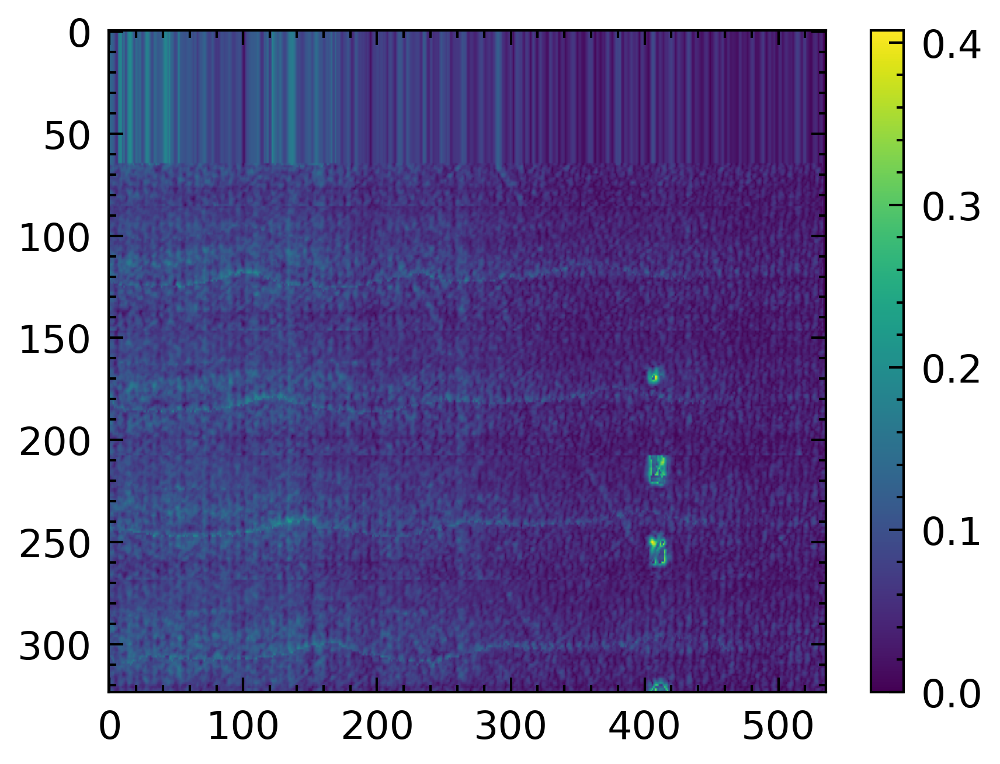

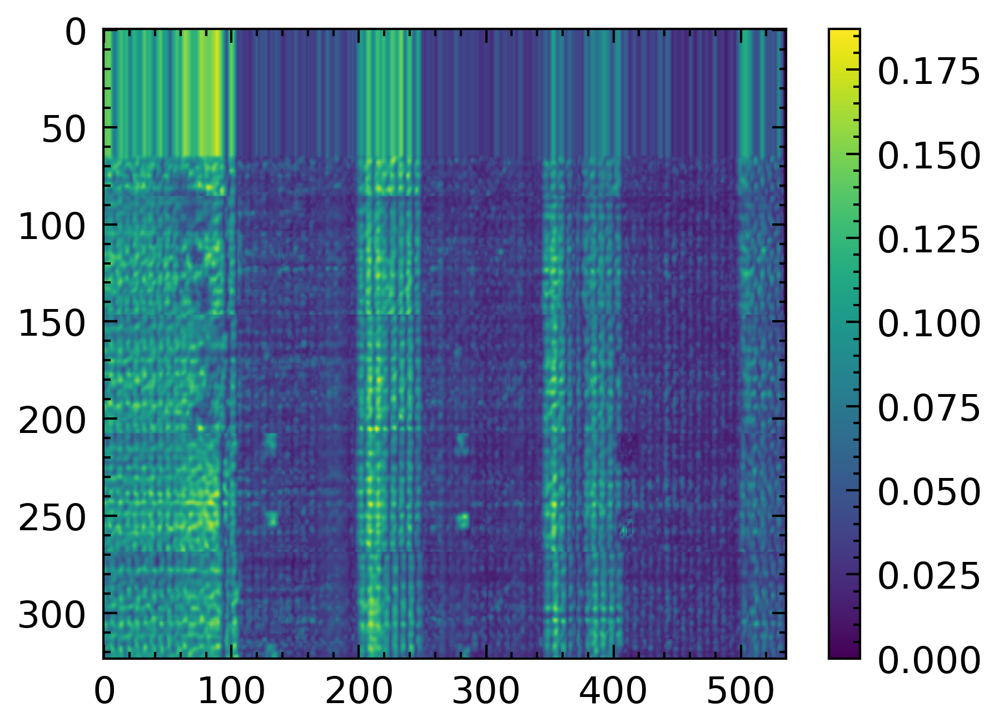

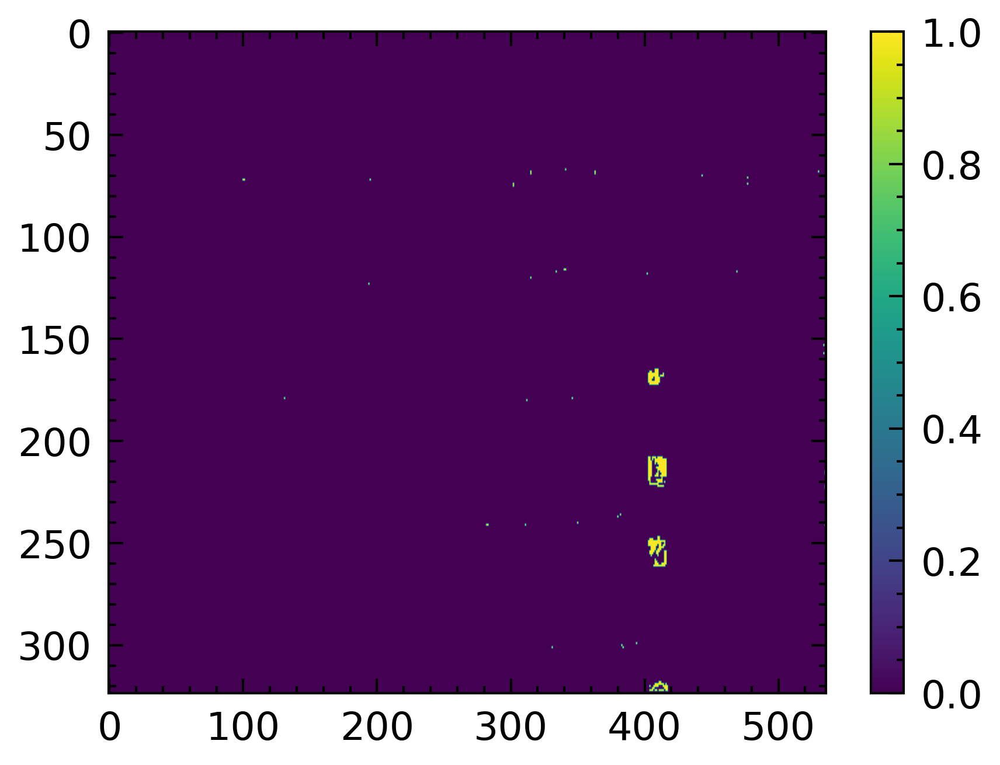

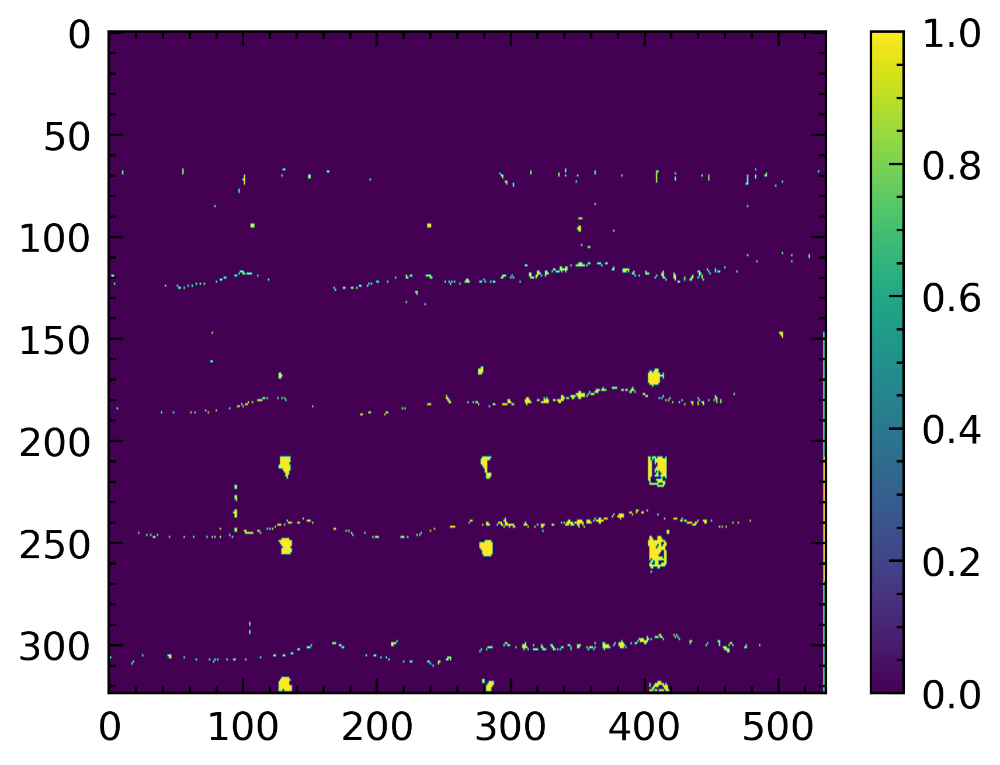

In [14]:
print(test.shape)
print(segmented_volume.shape)

plt.figure()
plt.imshow(test[:,35,:],aspect='auto')
plt.colorbar()

plt.figure()
plt.imshow(np.amax(test[:,100:,:],axis=1),aspect='auto')
plt.colorbar()

plt.figure()
plt.imshow(segmented_volume[:,35,:],aspect='auto')
plt.colorbar()

plt.figure()
plt.imshow(np.amax(segmented_volume[:,:,:], axis=1),aspect='auto')
plt.colorbar()

# plt.figure()
# plt.imshow(np.amax(test[:,30:,:], axis=1),aspect='auto')
# plt.colorbar()

# plt.figure()
# plt.imshow(np.amax(segmented_volume[:,20:,:], axis=1),aspect='auto')
# plt.colorbar()

# plt.figure()
# plt.plot(segmented_volume[:,32,0])

# plt.figure()
# plt.plot(test[:,32,:], label='data')
# plt.plot(segmented_volume[:,32,:], label='volume')
# plt.legend()

In [ ]:
print(test.shape)
print(segmented_volume.shape)

plt.figure()
plt.imshow(test[:,:,145],aspect='auto')
plt.colorbar()

plt.figure()
plt.imshow(segmented_volume[:,:,145],aspect='auto')
plt.colorbar()

print(test.shape)
print(segmented_volume.shape)

plt.figure()
plt.imshow(test[:,:,17],aspect='auto')
plt.colorbar()

plt.figure()
plt.imshow(segmented_volume[:,:,17],aspect='auto')
plt.colorbar()


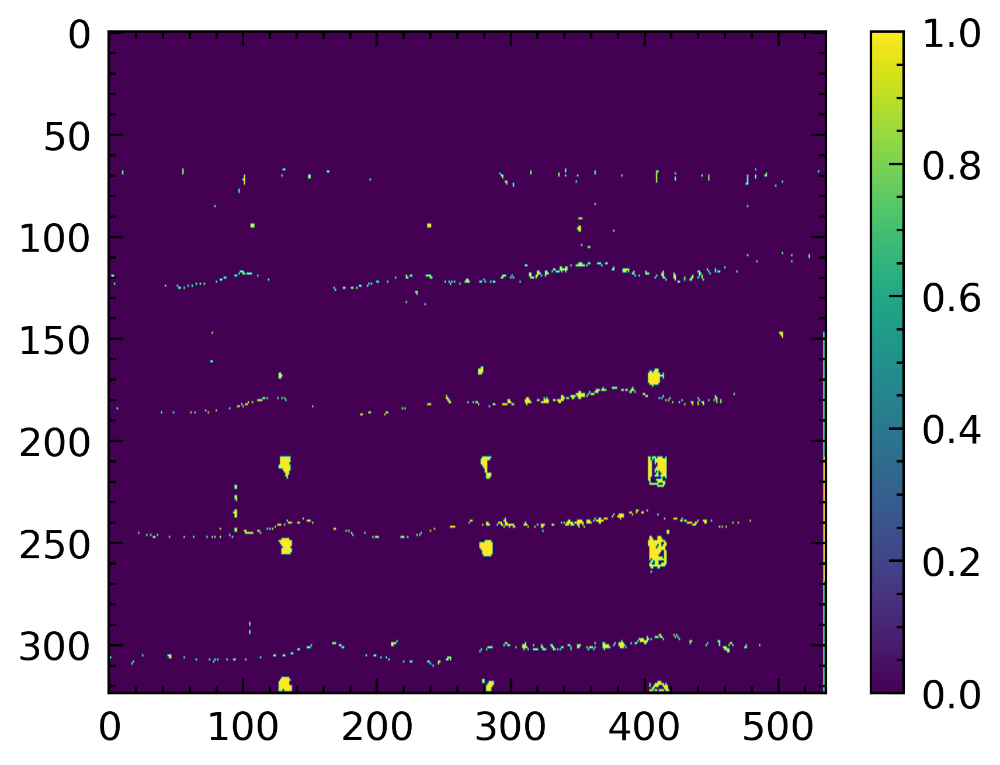

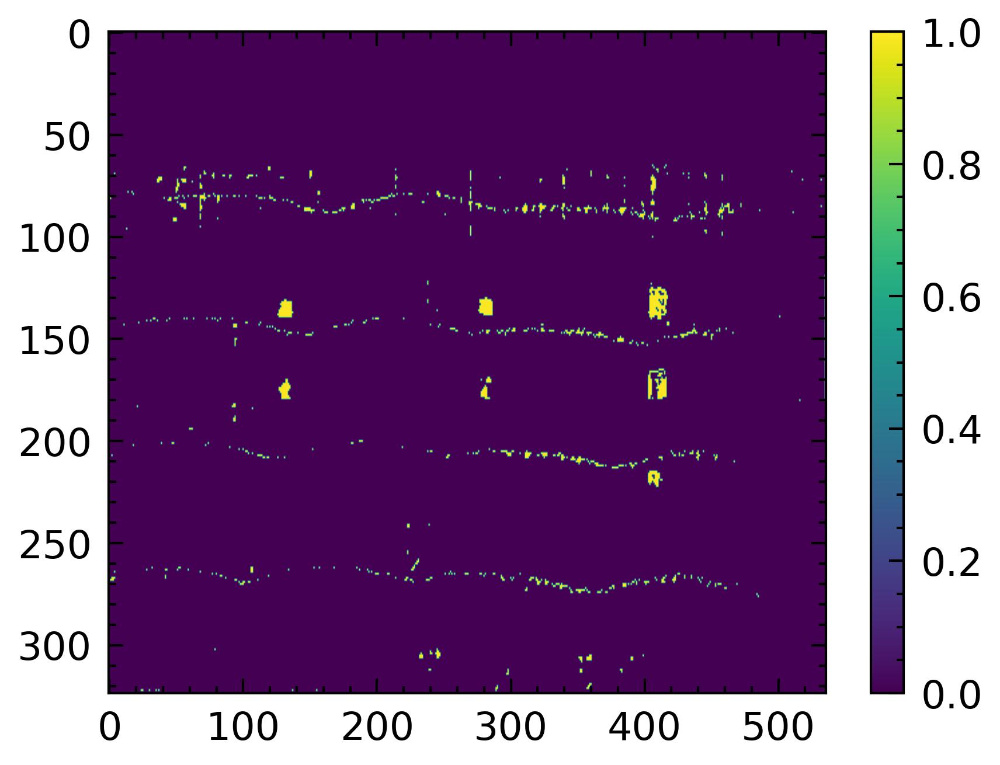

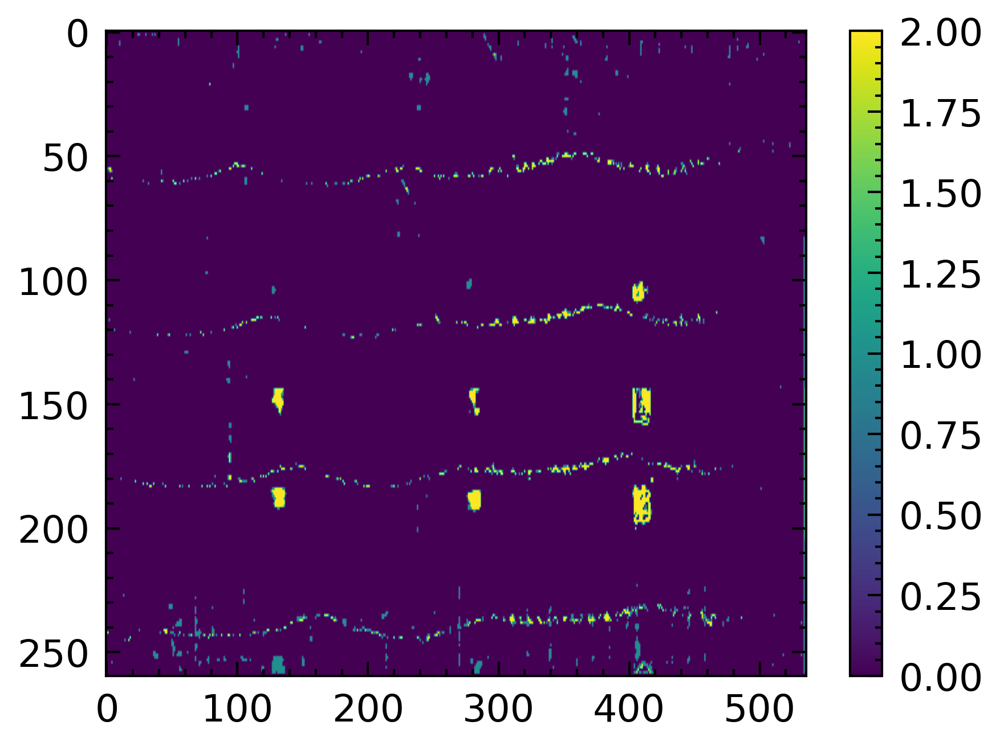

In [20]:
both_ways=np.copy(segmented_volume[64:,:,:])

both_ways=np.add(np.flip(segmented_volume_flipped[64:,:,:], axis=0), both_ways)
# both_ways[both_ways<2]=0
# both_ways[both_ways>0]=1

plt.figure()
plt.imshow(np.amax(segmented_volume[:,:,:], axis=1),aspect='auto')
plt.colorbar()
# plt.savefig('forward.png')
plt.show()


plt.figure()
plt.imshow(np.amax(segmented_volume_flipped[:,:,:], axis=1),aspect='auto')
plt.colorbar()
# plt.savefig('backward.png')
plt.show()

plt.figure()
plt.imshow(np.amax(both_ways, axis=1),aspect='auto')
plt.colorbar()
# plt.savefig('forward_and_backward.png')
plt.show()

In [15]:
np.save('results/learjet/forward_segmented_volume',segmented_volume)
np.save('results/learjet/test_data',test)
# np.save('results/segmented_volume_forward_and_back',both_ways)
# np.save('errors',errors_total)
# np.save('test_data',test)

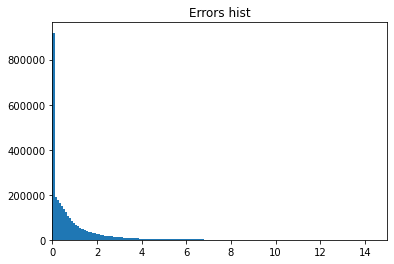

In [28]:
plt.figure()
plt.title('Errors hist')
plt.hist(errors_total.flatten(), bins=1000)
plt.xlim(0,15)
plt.show()

(271, 2000, 305)


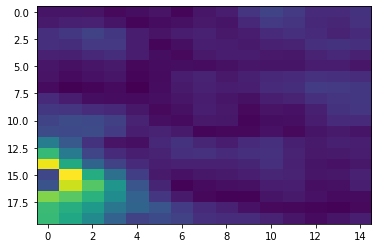

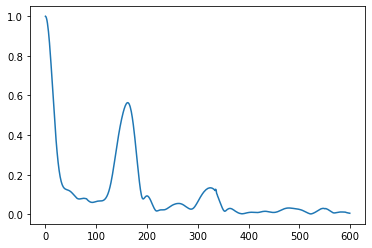

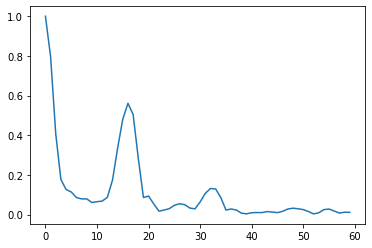

In [665]:
print(data.shape)
plt.figure()
plt.imshow(data[170:190,150,155:170], aspect='auto')

plt.figure()
plt.plot(data[185,:600,150])
plt.figure()

plt.plot(data[185,0:600:10,150])
# plt.plot(data[190,:,24])
# plt.plot(data[182,:,24])

1.070129231700755 2.0 1.7885372324887465
-72.30303607754493 21.392554865843188 -0.3869918240519434
(175, 294)


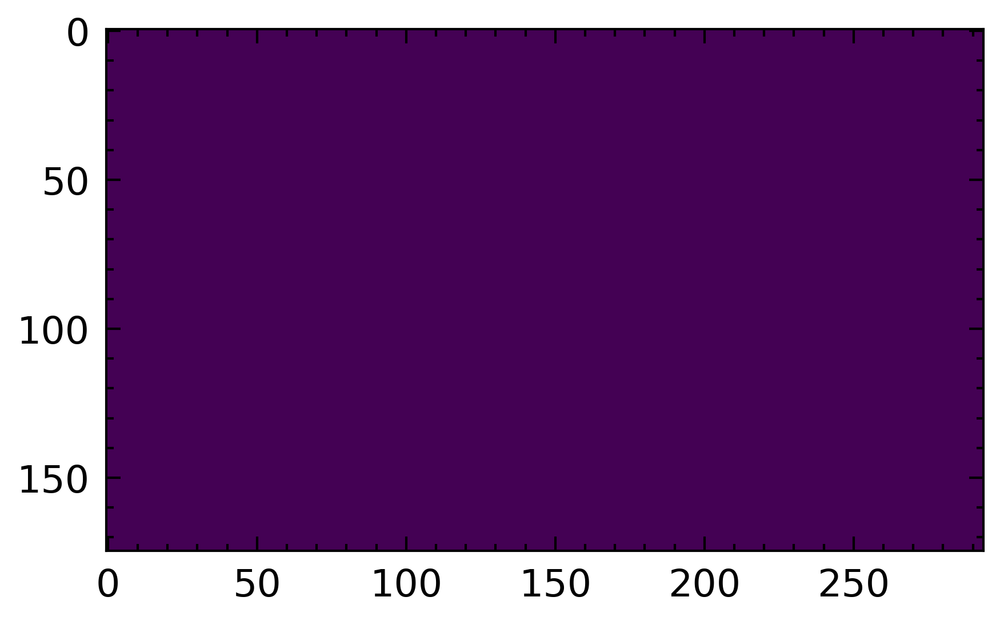

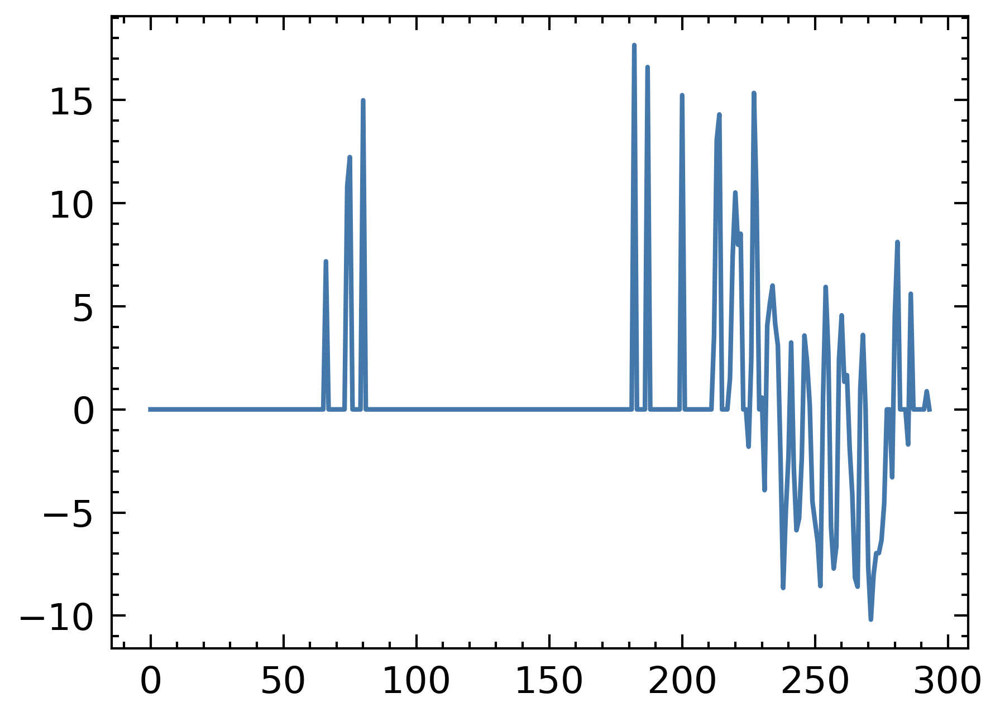

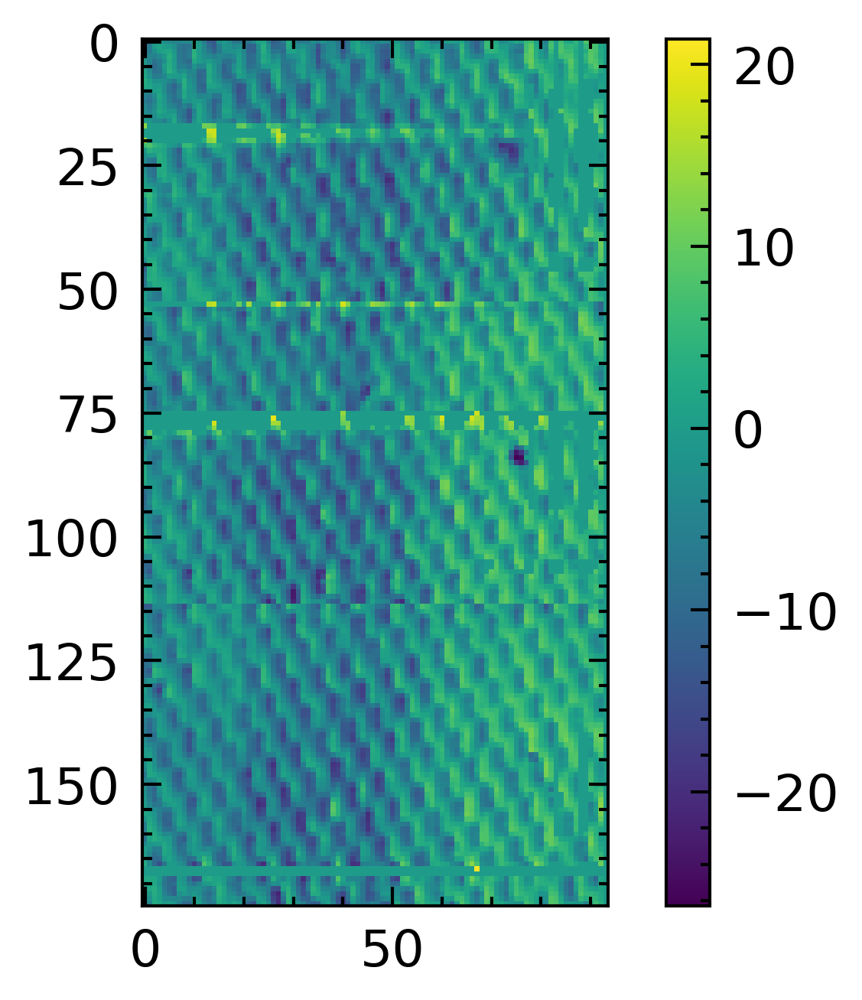

In [185]:
print(np.nanmin(mapped_data), np.nanmax(mapped_data), np.mean(mapped_data))
print(np.amin(errors), np.amax(errors), np.mean(errors))
print(errors.shape)

nan_mask = np.isnan(mapped_data)

# Create a plot showing NaN locations as a heatmap
plt.imshow(nan_mask, cmap='viridis', interpolation='nearest')

plt.figure()
plt.plot(errors[20,])

plt.figure()
plt.imshow(errors[:,200:])
plt.colorbar()

(175, 294)


TypeError: Invalid shape (60, 294, 175) for image data

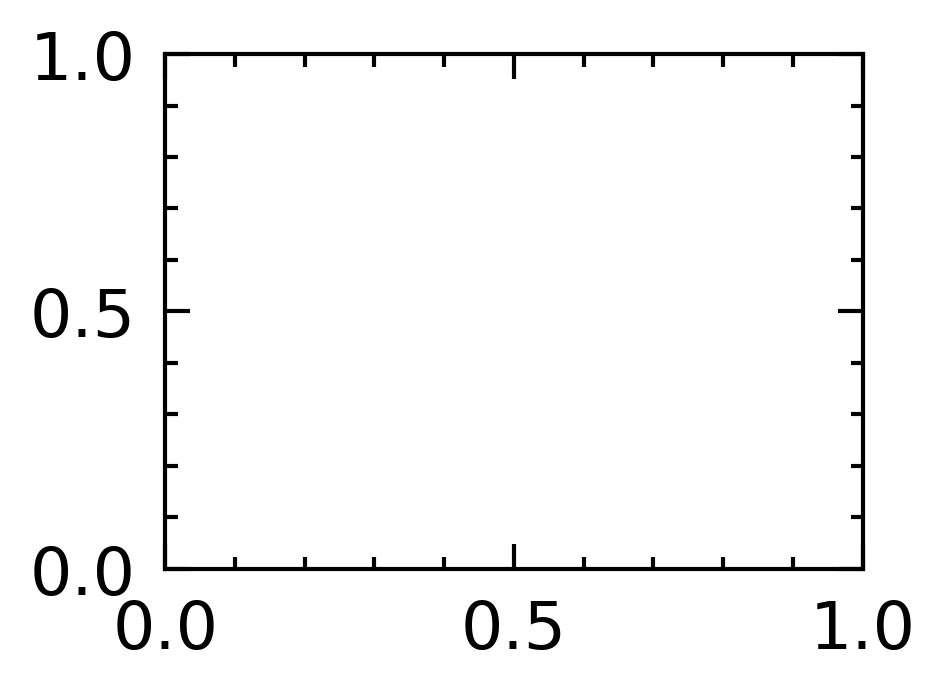

In [186]:
print(segmented.shape)
fig = plt.figure()

plt.subplot(2, 2, 1)
plt.imshow(np.swapaxes(test+1,0,1), aspect='auto')

plt.subplot(2, 2, 2)
plt.imshow(np.clip(mapped_data, 1,2), aspect='auto')

plt.subplot(2, 2, 3)
plt.imshow(np.clip(errors, 1,10), aspect='auto')
plt.colorbar()

plt.subplot(2, 2, 4)
plt.imshow(segmented, aspect='auto')
plt.colorbar()

plt.figure()
plt.imshow(abs(np.swapaxes(test+1,0,1)-np.clip(mapped_data, 1,5)), aspect='auto')
plt.colorbar()

In [187]:
plot = np.swapaxes(test+1,0,1)
print(plot.shape)
plt.figure()
plt.imshow(plot[:,150:200], aspect='auto')

plt.figure()
plt.plot(test[])

SyntaxError: invalid syntax (Temp/ipykernel_32788/2010781894.py, line 7)